In [ ]:
!pip install transformers

### Text Classification

In [ ]:
from transformers import pipeline

pipe = pipeline("text-generation", model="distilbert/distilgpt2")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

GPT2LMHeadModel LOAD REPORT from: distilbert/distilgpt2
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
transformer.h.{0, 1, 2, 3, 4, 5}.attn.bias | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [ ]:
classifier=pipeline('text-classification')

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f.
Using a pipeline without specifying a model name and revision in production is not recommended.


Loading weights:   0%|          | 0/104 [00:00<?, ?it/s]

In [ ]:
import pandas as pd
text = 'It was possible for him.so he did it.'
result=classifier(text)
result

[{'label': 'POSITIVE', 'score': 0.9747904539108276}]

In [ ]:
df=pd.DataFrame(result)
df

,label,score
0,POSITIVE,0.97479


In [ ]:
text = 'Nothing is impossible without these efforts!'
results = classifier(text)
df = pd.DataFrame(results)
df

,label,score
0,POSITIVE,0.996524


In [ ]:
text = 'Nothing is possible without these efforts!'
result = classifier(text)
df = pd.DataFrame(result)
df

,label,score
0,POSITIVE,0.994458


In [ ]:
text = 'It was so impressive but not upto the mark.'
result = classifier(text)
df = pd.DataFrame(result)
df

,label,score
0,NEGATIVE,0.983271


In [ ]:
text =  '''Hi [PRATIKSHA], thank you for the wonderful review! We are so glad you loved
 the new [Product/Feature]—our team worked hard to bring this to life,
and your feedback makes their day.'''
result = classifier(text)
df = pd.DataFrame(result)
df

,label,score
0,POSITIVE,0.999838


In [ ]:


text =  '''Life is full of beautiful moments waiting to be discovered if we just take a second to look around. Every single day brings a fresh start, a clean slate, and a brand-new opportunity to chase your dreams and spread kindness. Remember that you are entirely capable of handling whatever comes your way, and your potential is truly limitless. Trust the timing of your unique journey, celebrate your small wins, and never forget the incredible strength you carry within yourself. Surround yourself with laughter, embrace the lessons in every challenge, and keep moving forward with an open, hopeful heart. You are doing much better than you think you are, and the future holds so many bright things just for you!'''
result = classifier(text)
df = pd.DataFrame(result)
df

,label,score
0,POSITIVE,0.999823


In [ ]:
ner = pipeline('token-classification')
result=ner(text)
df = pd.DataFrame(result)
df

No model was supplied, defaulted to dbmdz/bert-large-cased-finetuned-conll03-english and revision 4c53496.
Using a pipeline without specifying a model name and revision in production is not recommended.


Loading weights:   0%|          | 0/391 [00:00<?, ?it/s]

BertForTokenClassification LOAD REPORT from: dbmdz/bert-large-cased-finetuned-conll03-english
Key                      | Status     |  | 
-------------------------+------------+--+-
bert.pooler.dense.weight | UNEXPECTED |  | 
bert.pooler.dense.bias   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


""


In [ ]:
qa=pipeline('question-answering')

No model was supplied, defaulted to distilbert/distilbert-base-cased-distilled-squad and revision 564e9b5.
Using a pipeline without specifying a model name and revision in production is not recommended.


Loading weights:   0%|          | 0/102 [00:00<?, ?it/s]

In [ ]:
import pandas as pd
from transformers import pipeline

text = 'New Delhi is capital city of India.'
question = 'What is capital city of India?'
result_qa = qa(question=question, context=text)

df = pd.DataFrame([result_qa])
print(df)


      score  start  end     answer
0  0.996635      0    9  New Delhi


In [ ]:
text = '''
Antarctica (/ænˈtɑːrktɪkə/ ⓘ)[note 1] is Earth's southernmost and least-populated continent.
Situated almost entirely south of the Antarctic Circle and surrounded by the Southern Ocean (also known
as the Antarctic Ocean), it contains the geographic South Pole. Antarctica is the fifth-largest continent,
being about 40% larger than Europe, and has an area of 14,200,000 km2 (5,500,000 sq mi). Most of
Antarctica is covered by the Antarctic ice sheet, with an average thickness of 1.9 km (1.2 mi).

Antarctica is, on average, the coldest, driest, and windiest of the continents, and has the highest average elevation.
It is mainly a polar desert, with annual precipitation of over 200 mm (8 in) along the coast and far less inland. About
70% of the world's freshwater reserves are frozen in Antarctica, which, if melted, would raise global sea levels by
almost 60 metres (200 ft). Antarctica holds the record for the lowest measured temperature on Earth, −89.2 °C (−128.6 °F).

The coastal regions can reach temperatures over 10 °C (50 °F) in the summer.
Native species of animals include mites, nematodes, penguins, seals and tardigrades. Where vegetation occurs,
it is mostly in the form of lichen or moss
'''

question = "What do native species of animals include?"

result_qa = qa(question=question, context=text)
df = pd.DataFrame([result_qa])
df

,score,start,end,answer
0,0.037188,1095,1121,"mites, nematodes, penguins"


In [ ]:
generator=pipeline('text-generation', model='gpt2')

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

GPT2LMHeadModel LOAD REPORT from: gpt2
Key                  | Status     |  | 
---------------------+------------+--+-
h.{0...11}.attn.bias | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [ ]:
data=generator('I want to learn Python Programming so',
               max_length=30,num_return_sequences=3)

Passing `generation_config` together with generation-related arguments=({'max_length', 'num_return_sequences'}) is deprecated and will be removed in future versions. Please pass either a `generation_config` object OR all generation parameters explicitly, but not both.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Both `max_new_tokens` (=256) and `max_length`(=30) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


In [ ]:
data

[{'generated_text': 'I want to learn Python Programming so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different program

In [ ]:
for sent in data:
  print(sent)

{'generated_text': 'I want to learn Python Programming so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different programming languages. I want to learn Python so I can learn programming from different programming languages.\n\nI want to learn Python so I can learn programming from different programm

In [ ]:
data=generator('I have recently joined cdac for',
               max_length=30,num_return_sequences=3)

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Both `max_new_tokens` (=256) and `max_length`(=30) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


In [ ]:
data

[{'generated_text': 'I have recently joined cdac for the first time. I am looking forward to the new generation of cdac software and it is my pleasure to bring you more information about this wonderful product from the cdac website and cdac.com, the maker of this great software.\n\nThe cdac 2.x is a 4.6mm (12-megapixel) CMOS sensor, which translates into a bright, clear image that is easy to focus and focus in. The digital SLR digital camera is built like a camera, and works by using a digital mirror and a digital flash. The front of the CMOS sensor is coated with a thin film, and the front edge is covered by a matte black film. The back of the camera is covered by a clear black film, and it has a sharp, light and sharp light sensor, which are very suitable for all types of photography. The CMOS sensor is made from a lightweight, low-cost plastic, and it has a black coating. The CMOS sensor is extremely bright, and the flash is a 2K LED. The software is very simple in its design, and t

In [ ]:
for sent in data:
  print(sent)

{'generated_text': 'I have recently joined cdac for the first time. I am looking forward to the new generation of cdac software and it is my pleasure to bring you more information about this wonderful product from the cdac website and cdac.com, the maker of this great software.\n\nThe cdac 2.x is a 4.6mm (12-megapixel) CMOS sensor, which translates into a bright, clear image that is easy to focus and focus in. The digital SLR digital camera is built like a camera, and works by using a digital mirror and a digital flash. The front of the CMOS sensor is coated with a thin film, and the front edge is covered by a matte black film. The back of the camera is covered by a clear black film, and it has a sharp, light and sharp light sensor, which are very suitable for all types of photography. The CMOS sensor is made from a lightweight, low-cost plastic, and it has a black coating. The CMOS sensor is extremely bright, and the flash is a 2K LED. The software is very simple in its design, and th

visual question answering

In [ ]:

vqa=pipeline('visual-question-answering')

No model was supplied, defaulted to dandelin/vilt-b32-finetuned-vqa and revision d0a1f6a.
Using a pipeline without specifying a model name and revision in production is not recommended.


Loading weights:   0%|          | 0/212 [00:00<?, ?it/s]

ViltForQuestionAnswering LOAD REPORT from: dandelin/vilt-b32-finetuned-vqa
Key                                          | Status     |  | 
---------------------------------------------+------------+--+-
vilt.embeddings.text_embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
The image processor of type `ViltImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


In [ ]:
from PIL import Image

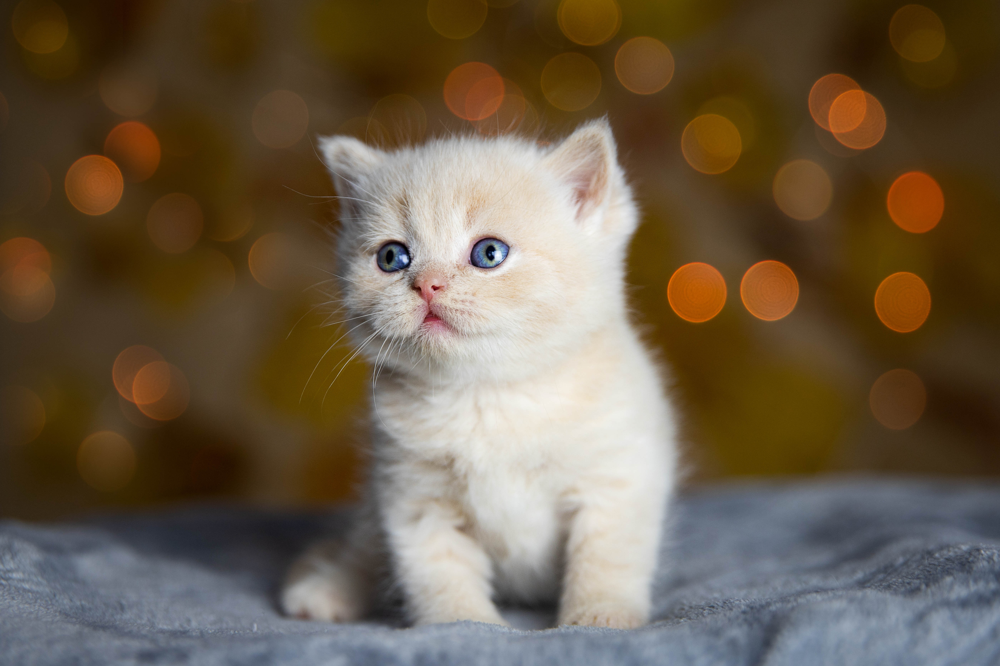

In [ ]:
image=Image.open('cat.jpg')
image

In [ ]:
question = 'What cat is doing?'
vqa(image, question, top_k=1)[0]['answer']

'sitting'

In [ ]:
question = 'What is these in image ?'
vqa(image, question, top_k=1)[0]['answer']

'kitten'

In [ ]:
question = 'What is color of eyes?'
vqa(image, question, top_k=1)[0]['answer']


'blue'

In [ ]:
doc_qa = pipeline(
    "document-question-answering",
    model="naver-clova-ix/donut-base-finetuned-docvqa"
)

Loading weights:   0%|          | 0/484 [00:00<?, ?it/s]

The tied weights mapping and config for this model specifies to tie decoder.model.decoder.embed_tokens.weight to decoder.lm_head.weight, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
The image processor of type `DonutImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


In [ ]:
image = Image.open("invoice.png")

In [ ]:
pipe = pipeline("text-to-speech", model="suno/bark-small")

Loading weights:   0%|          | 0/542 [00:00<?, ?it/s]

The tied weights mapping and config for this model specifies to tie fine_acoustics.input_embeds_layers.1.weight to fine_acoustics.lm_heads.0.weight, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
The tied weights mapping and config for this model specifies to tie fine_acoustics.input_embeds_layers.2.weight to fine_acoustics.lm_heads.1.weight, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
The tied weights mapping and config for this model specifies to tie fine_acoustics.input_embeds_layers.3.weight to fine_acoustics.lm_heads.2.weight, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
The tied weights mapping and config for this model specifies to tie fine_acoustics.input_embeds_l

In [ ]:
text = "happy birthdat to you "
output = pipe(text)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:10000 for open-end generation.
Both `max_new_tokens` (=768) and `max_length`(=20) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=60) and `max_length`(=20) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=60) and `max_length`(=20) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both

In [ ]:
from IPython.display import Audio
Audio(output["audio"], rate=output["sampling_rate"])

In [ ]:
asr = pipeline("automatic-speech-recognition")

No model was supplied, defaulted to facebook/wav2vec2-base-960h and revision 22aad52.
Using a pipeline without specifying a model name and revision in production is not recommended.


Loading weights:   0%|          | 0/212 [00:00<?, ?it/s]

Wav2Vec2ForCTC LOAD REPORT from: facebook/wav2vec2-base-960h
Key                        | Status  | 
---------------------------+---------+-
wav2vec2.masked_spec_embed | MISSING | 

Notes:
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [ ]:
output = asr("download.wav")
print(output['text'])

DID YOU STAN BACK AN DA
